In [1]:
import os
import sys
import torch
import torch.nn as nn
import torch.nn.functional as F
from skimage import data
import numpy as np
import matplotlib.pyplot as plt
from skimage.transform import resize
import json
import deepinv as dinv
from skimage.transform import iradon
from torch.utils.data import Dataset, DataLoader
from torch import Tensor
from itertools import repeat
import odl
from odl.phantom import ellipsoid_phantom
from odl import uniform_discr
from Model_arch import UNet


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


/home/ktaghavi/miniconda3/envs/msc_dip_project/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
def calculate_psnr(original, denoised):
    """
    Compute PSNR between two NumPy arrays in [0,1], same shape.
    """
    eps = 1e-10
    mse = np.mean((original - denoised) ** 2)
    if mse == 0:
        return 100
    max_pixel = np.max(original)
    return 10 * np.log10(((max_pixel**2) + eps) / mse)

def nabla(x):
        r"""
        Applies the finite differences operator associated with tensors of the same shape as x.
        """
        b, c, h, w = x.shape
        u = torch.zeros((b, c, h, w, 2), device=x.device).type(x.dtype)
        u[:, :, :-1, :, 0] = u[:, :, :-1, :, 0] - x[:, :, :-1]
        u[:, :, :-1, :, 0] = u[:, :, :-1, :, 0] + x[:, :, 1:]
        u[:, :, :, :-1, 1] = u[:, :, :, :-1, 1] - x[..., :-1]
        u[:, :, :, :-1, 1] = u[:, :, :, :-1, 1] + x[..., 1:]
        return u

In [3]:
class OperatorFunction(torch.autograd.Function):
    @staticmethod
    def forward(ctx, operator, x):
        # ctx.operator saved for backward
        ctx.operator = operator
        # call the DeepInv forward operator A
        with torch.no_grad():
            out = operator.A(x)
        # no need to save x unless A is nonlinear
        return out

    @staticmethod
    def backward(ctx, grad_output):
        # in the backward pass, apply the adjoint A_adjoint
        operator = ctx.operator
        grad_input = operator.A_adjoint(grad_output)
        # first returned None says “no gradient for operator”
        return None, grad_input

class OperatorModule(torch.nn.Module):
    def __init__(self, operator):
        super().__init__()
        self.operator = operator

    def forward(self, x):
        # call our custom Function
        return OperatorFunction.apply(self.operator, x)

    def A_dagger(self, y):
        # if you ever want to call the adjoint directly
        return self.operator.A_dagger(y)

In [4]:
angles_torch = torch.linspace(0,180,60,device=device)
physics_raw = dinv.physics.Tomography(
    img_width=256, angles=angles_torch, device=device,
    noise_model=dinv.physics.GaussianNoise(sigma=0.05)
)

physics = OperatorModule(physics_raw)

Data shape: torch.Size([1, 1, 256, 256])


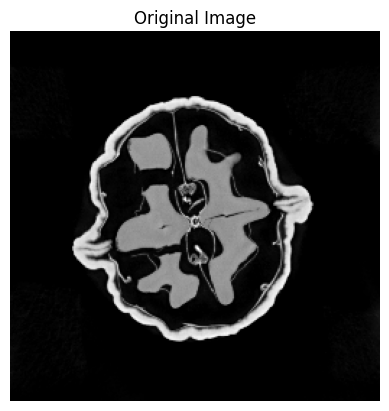

Data shape after unsqueeze: torch.Size([1, 1, 256, 256])


In [5]:
walnut_data = torch.load("walnut.pt", map_location=device)
walnut_data = walnut_data.to(device)

print("Data shape:", walnut_data.shape)

img_walnut = walnut_data.squeeze().cpu().numpy()
plt.imshow(img_walnut, cmap='gray')
plt.title("Original Image")
plt.axis('off')
plt.show()
plt.close()

if walnut_data.ndim == 3:
    walnut_data = walnut_data.unsqueeze(0)
elif walnut_data.ndim == 2:
    walnut_data = walnut_data.unsqueeze(0).unsqueeze(0)
print("Data shape after unsqueeze:", walnut_data.shape)

epochs = 6000

### classical TV‐minimization in ODL

Iteration 4679, current converge crit. = 1.00E-05, objective = 1.00E-05 
FBP    PSNR: -65.02 dB
TV-PGD PSNR: 25.73 dB


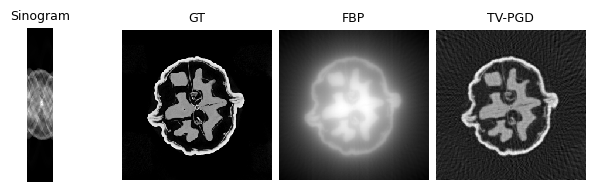

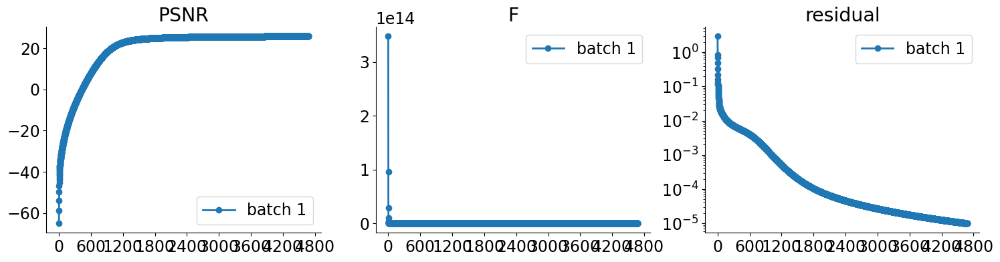

In [6]:
from deepinv.optim.data_fidelity import L2
from deepinv.optim.prior        import TVPrior
from deepinv.optim.optimizers   import optim_builder


if isinstance(walnut_data, dict):
    walnut = walnut_data["walnut"]
else:
    walnut = walnut_data
walnut = walnut.to(device)

# 3) Simulate data
y = physics_raw.A(walnut)    # forward project → [1,1,det,ang]

# 4) Set up TV–PGD solver
data_fidelity = L2()
prior = TVPrior(n_it_max=20)


# Algorithm parameters
verbose = True
stepsize = 1e-4 # stepsize for PGD
lamb = 1e-2  # TV regularisation parameter
params_algo = {"stepsize": stepsize, "lambda": lamb}
max_iter = 10000
early_stop = True

# Instantiate the algorithm class to solve the problem.
model = optim_builder(
    iteration="PGD",
    prior=prior,
    data_fidelity=data_fidelity,
    early_stop=early_stop,
    max_iter=max_iter,
    verbose=verbose,
    params_algo=params_algo,
)

# 5) Run FBP and TV–PGD
x_lin = physics_raw.A_adjoint(y)       # pure back‐projection
x_model, metrics = model(
    y,
    physics=physics_raw,
    x_gt=walnut,
    compute_metrics=True,
)

# 6) Compute PSNR
psnr_fbp = dinv.metric.PSNR()(walnut, x_lin).item()
psnr_tv  = dinv.metric.PSNR()(walnut, x_model).item()

print(f"FBP    PSNR: {psnr_fbp:.2f} dB")
print(f"TV-PGD PSNR: {psnr_tv:.2f} dB")

# 7) Plot results
imgs   = [y, walnut, x_lin, x_model]
titles = ["Sinogram", "GT", "FBP", "TV-PGD"]
dinv.utils.plot(imgs, titles=titles)

# 8) Plot convergence curves if available
if metrics:
    dinv.utils.plot_curves(metrics)
psnr_classic = metrics["psnr"][-1]

### DIP with Ellipses Pre Trained Weight

In [7]:
from Model_arch import UNet

angles_torch = torch.linspace(0, 180, 60, dtype = torch.float32, device=device) 
Height, Width = walnut_data.shape[-2], walnut_data.shape[-1]
physics_raw = dinv.physics.Tomography(
    img_width = Width, 
    angles=angles_torch, 
    device=device,
    noise_model=dinv.physics.GaussianNoise(sigma=0.8)
)
physics_new = OperatorModule(physics_raw)

ellipse_model = UNet(1,1)
ellipse_pretrained_weight= torch.load("checkpoints/pre_model.pth", map_location=device)
ellipse_model.load_state_dict(ellipse_pretrained_weight)
ellipse_model.to(device)

UNet(
  (encoder1): Encoder(
    (conv1): ConvBlock(
      (conv): Conv2d(1, 32, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
      (act): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (conv2): ConvBlock(
      (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (act): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (downsample): ConvBlock(
      (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (act): LeakyReLU(negative_slope=0.2, inplace=True)
    )
  )
  (encoder2): Encoder(
    (conv1): ConvBlock(
      (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (act): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (conv2): ConvBlock(
      (conv): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (act): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (downsample): ConvBlock(
      (conv): Conv2d(64, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 

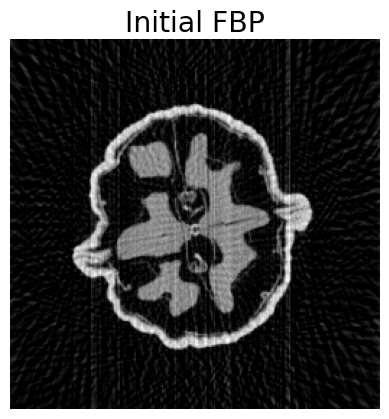

Initial PSNR: 22.78 dB
Epoch 0, Loss: 0.8097
PSNR: 29.47 dB


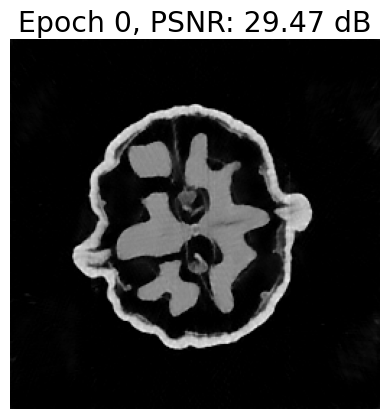

Epoch 100, Loss: 0.5220
PSNR: 27.50 dB


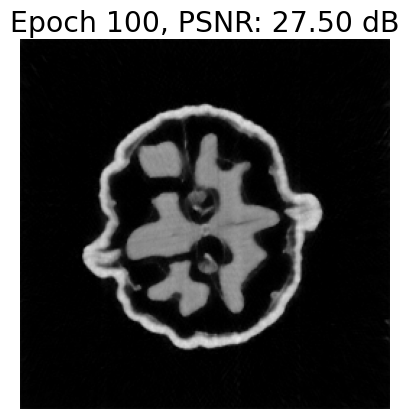

Epoch 200, Loss: 0.2785
PSNR: 28.62 dB


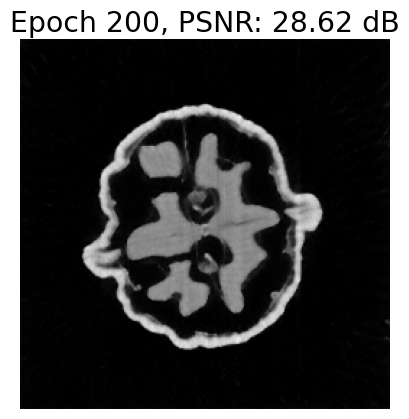

Epoch 300, Loss: 0.1970
PSNR: 29.18 dB


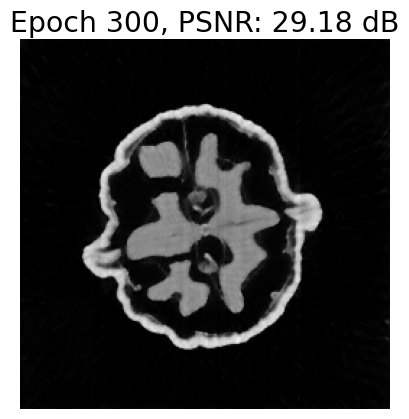

Epoch 400, Loss: 0.1765
PSNR: 29.36 dB


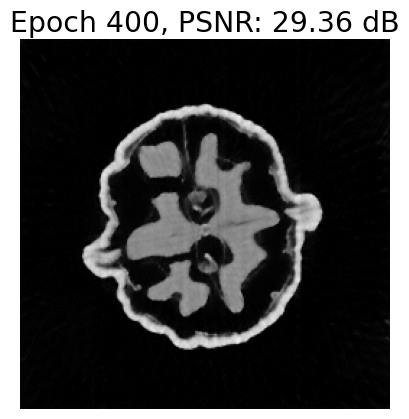

Epoch 500, Loss: 0.1605
PSNR: 29.54 dB


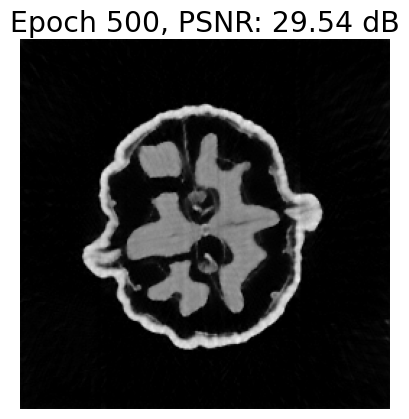

Epoch 600, Loss: 0.1741
PSNR: 29.68 dB


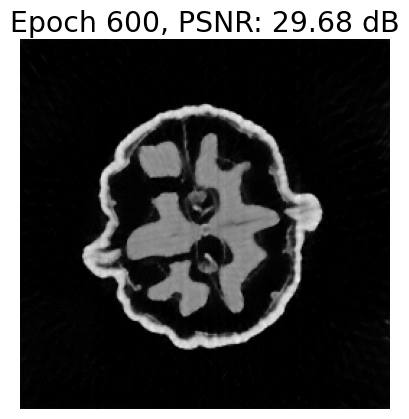

Epoch 700, Loss: 0.1361
PSNR: 29.77 dB


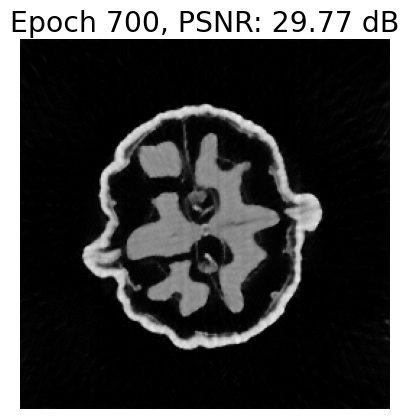

Epoch 800, Loss: 0.1626
PSNR: 29.83 dB


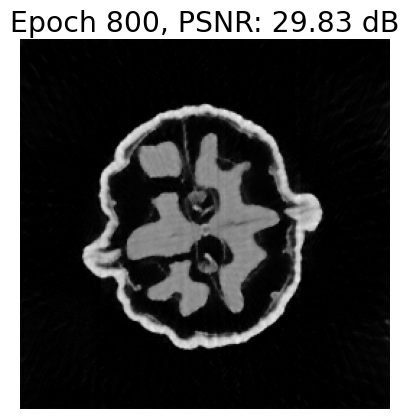

Epoch 900, Loss: 0.2413
PSNR: 29.82 dB


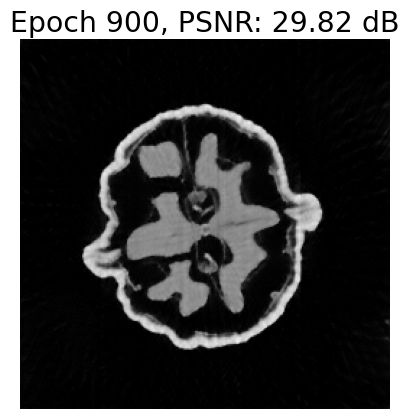

Epoch 1000, Loss: 0.1186
PSNR: 30.00 dB


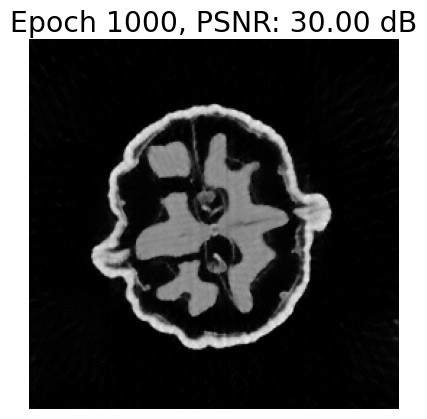

Epoch 1100, Loss: 0.1435
PSNR: 30.03 dB


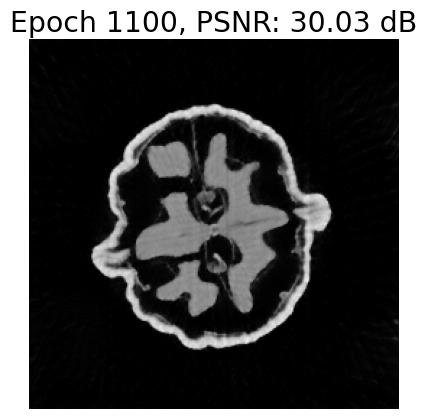

Epoch 1200, Loss: 0.1321
PSNR: 30.02 dB


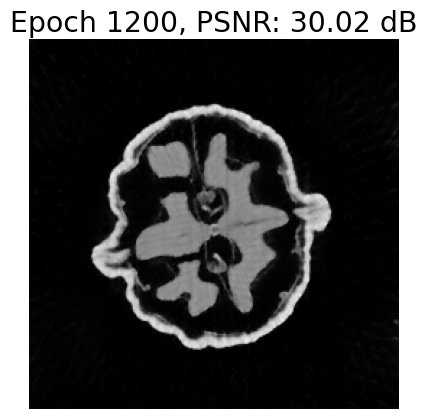

Epoch 1300, Loss: 0.1071
PSNR: 30.09 dB


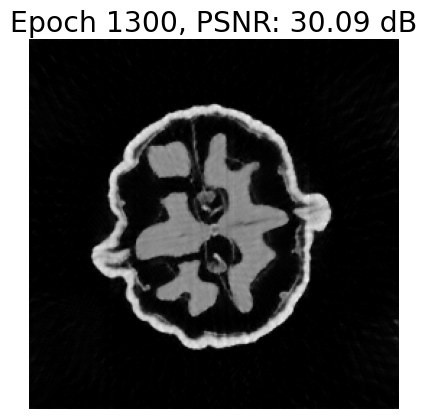

Epoch 1400, Loss: 0.1111
PSNR: 30.13 dB


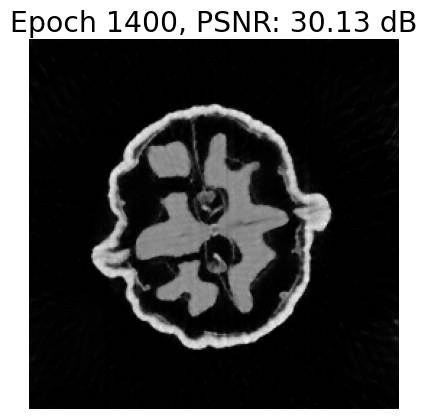

Epoch 1500, Loss: 0.1008
PSNR: 30.14 dB


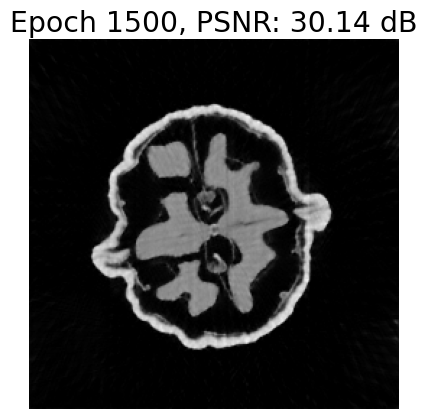

Epoch 1600, Loss: 0.1183
PSNR: 30.16 dB


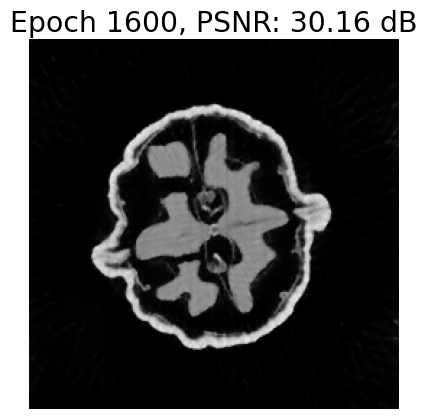

Epoch 1700, Loss: 0.0961
PSNR: 30.14 dB


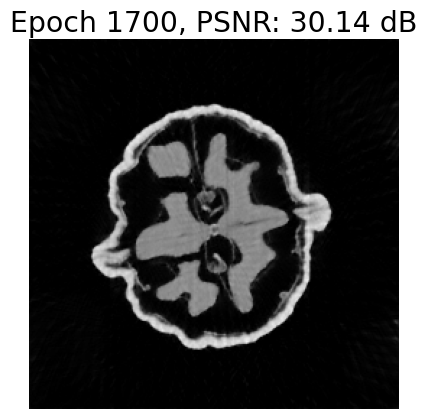

Epoch 1800, Loss: 0.1225
PSNR: 30.14 dB


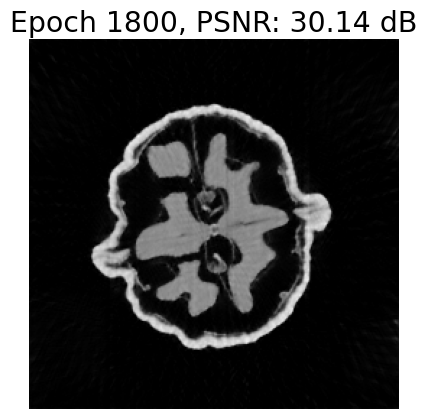

Epoch 1900, Loss: 0.1371
PSNR: 30.17 dB


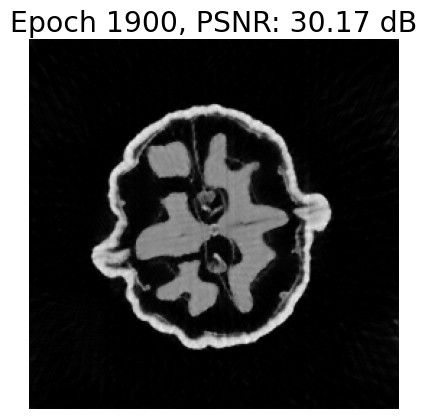

Epoch 2000, Loss: 0.0895
PSNR: 30.23 dB


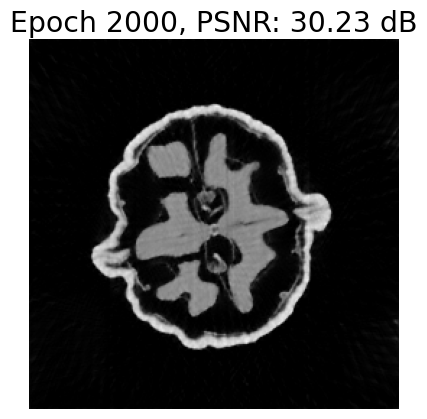

Epoch 2100, Loss: 0.1079
PSNR: 30.20 dB


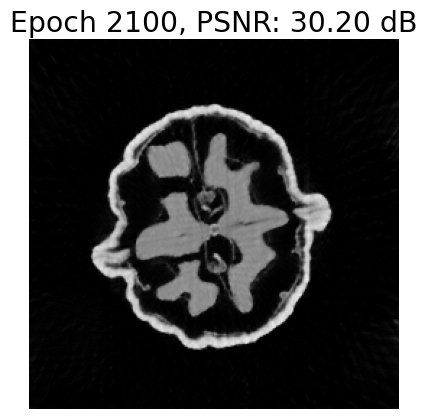

Epoch 2200, Loss: 0.0980
PSNR: 30.22 dB


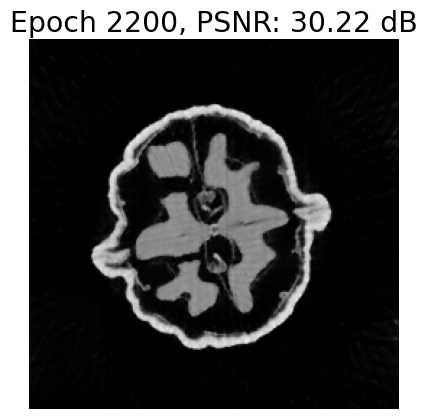

Epoch 2300, Loss: 0.0839
PSNR: 30.22 dB


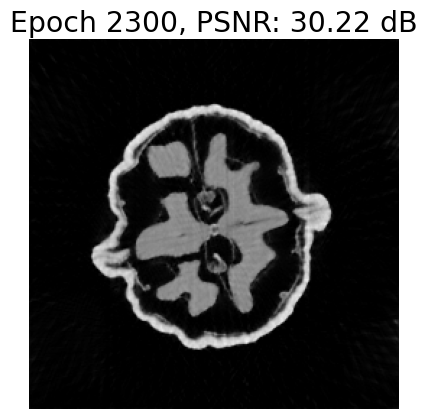

Epoch 2400, Loss: 0.0901
PSNR: 30.21 dB


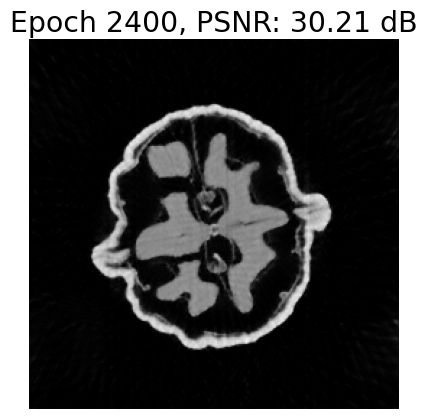

Epoch 2500, Loss: 0.0957
PSNR: 30.22 dB


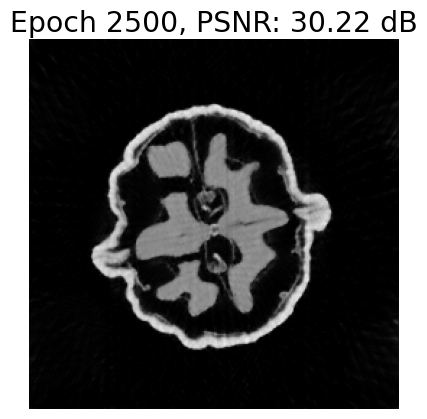

Epoch 2600, Loss: 0.1104
PSNR: 30.21 dB


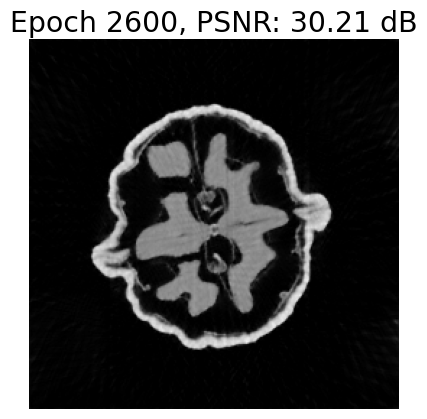

Epoch 2700, Loss: 0.0833
PSNR: 30.26 dB


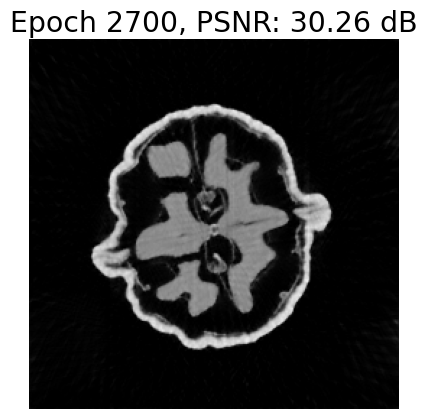

Epoch 2800, Loss: 0.1041
PSNR: 30.26 dB


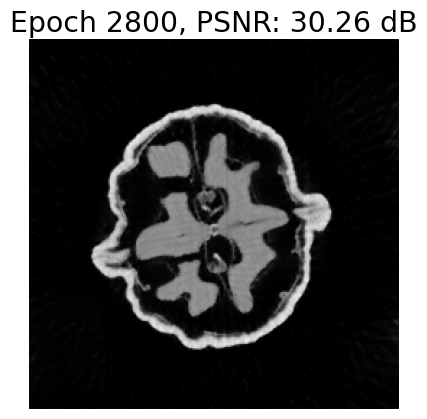

Epoch 2900, Loss: 0.0912
PSNR: 30.25 dB


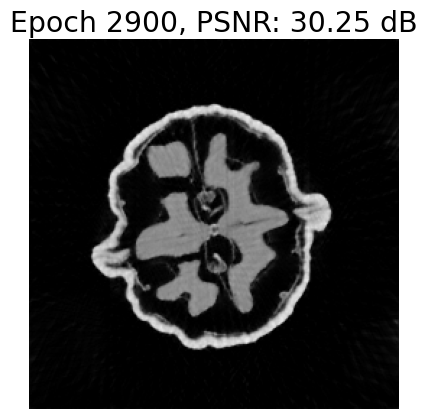

Epoch 3000, Loss: 0.1135
PSNR: 30.24 dB


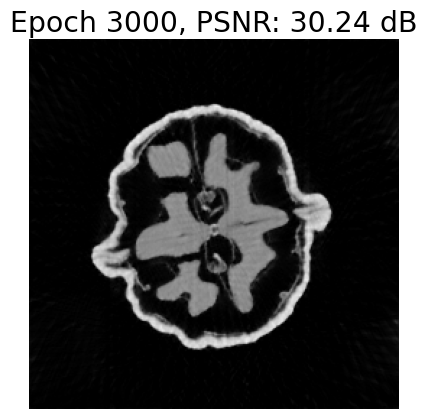

Epoch 3100, Loss: 0.0760
PSNR: 30.26 dB


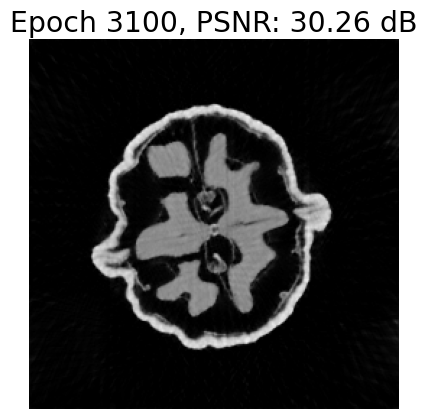

Epoch 3200, Loss: 0.1843
PSNR: 30.22 dB


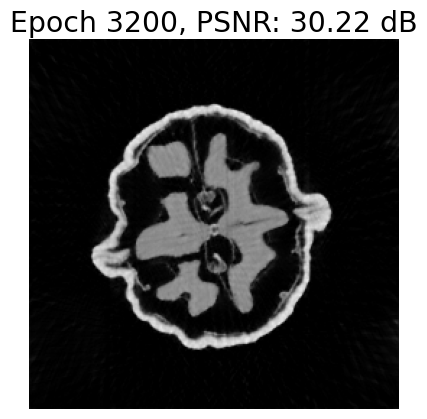

Epoch 3300, Loss: 0.0790
PSNR: 30.26 dB


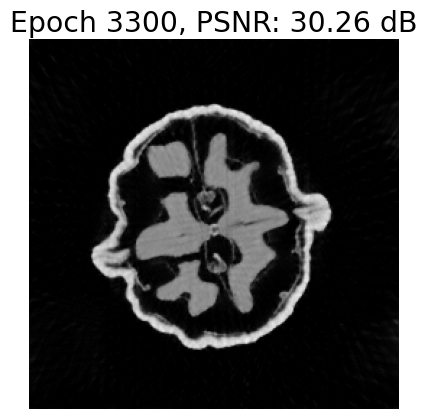

Epoch 3400, Loss: 0.1106
PSNR: 30.27 dB


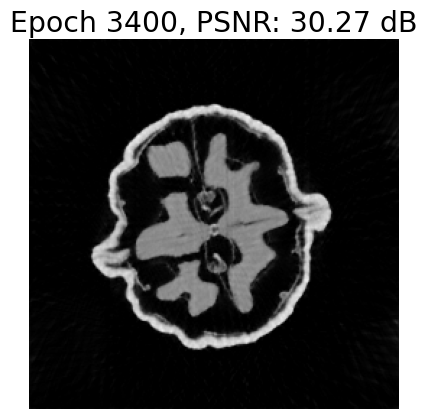

Epoch 3500, Loss: 0.0903
PSNR: 30.26 dB


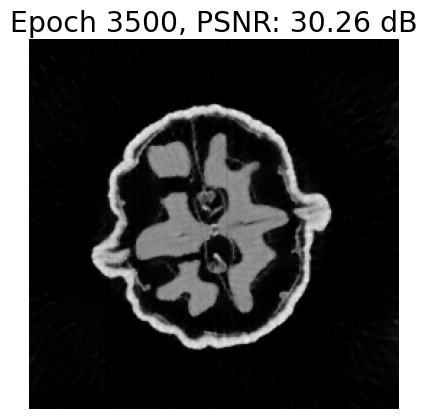

Epoch 3600, Loss: 0.1021
PSNR: 30.22 dB


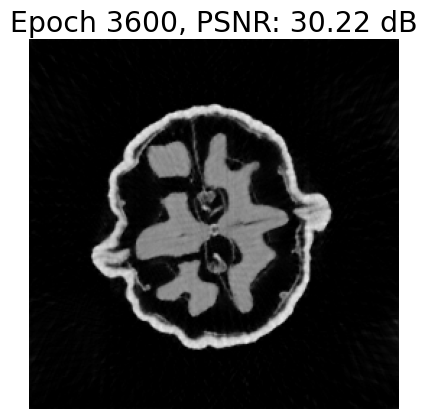

Epoch 3700, Loss: 0.0705
PSNR: 30.26 dB


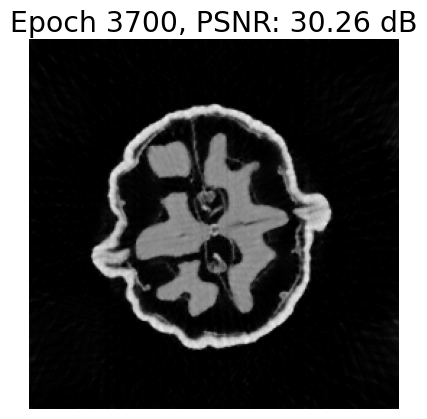

Epoch 3800, Loss: 0.0664
PSNR: 30.26 dB


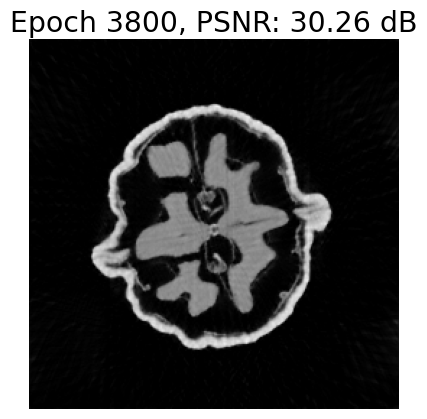

Epoch 3900, Loss: 0.0644
PSNR: 30.23 dB


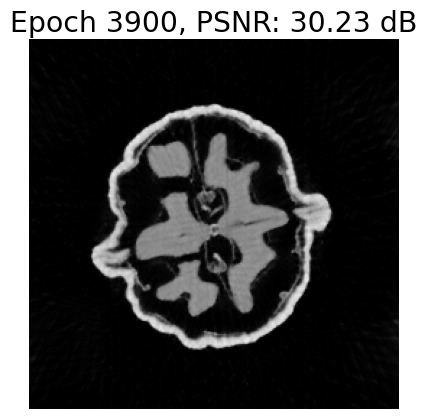

Epoch 4000, Loss: 0.0716
PSNR: 30.22 dB


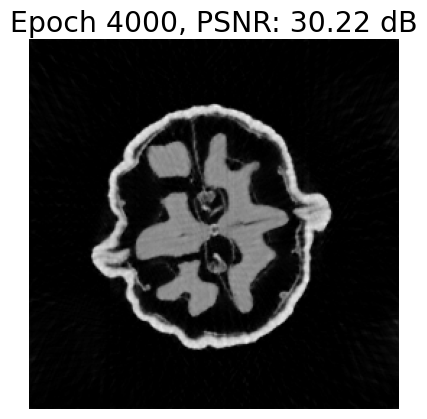

Epoch 4100, Loss: 0.0630
PSNR: 30.19 dB


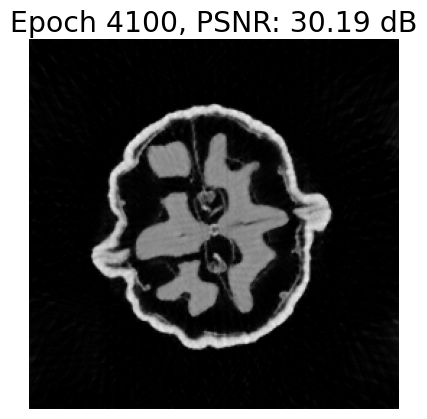

Epoch 4200, Loss: 0.1105
PSNR: 30.20 dB


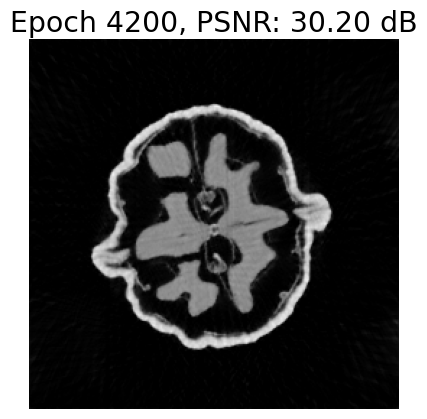

Epoch 4300, Loss: 0.0824
PSNR: 30.25 dB


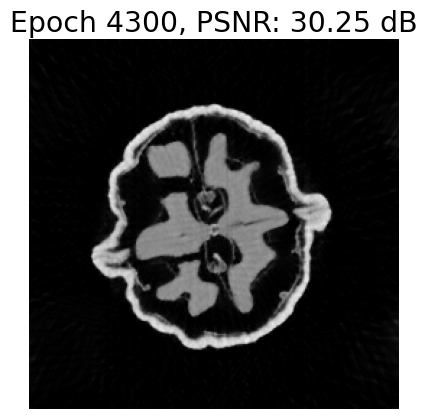

Epoch 4400, Loss: 0.0632
PSNR: 30.28 dB


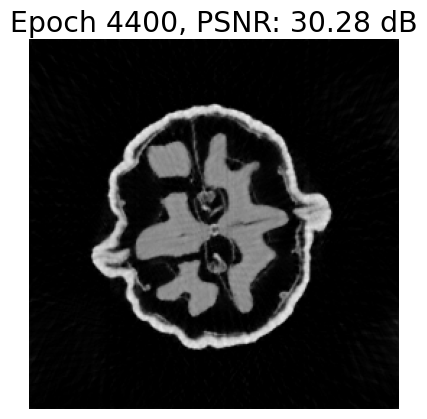

Epoch 4500, Loss: 0.0692
PSNR: 30.22 dB


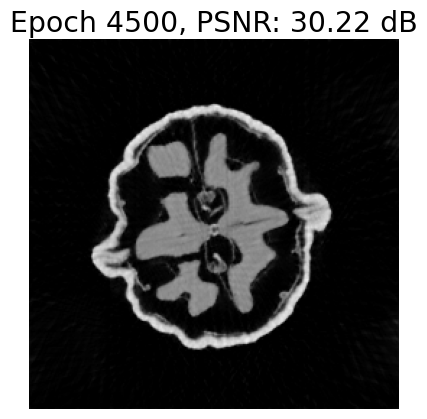

Epoch 4600, Loss: 0.0633
PSNR: 30.22 dB


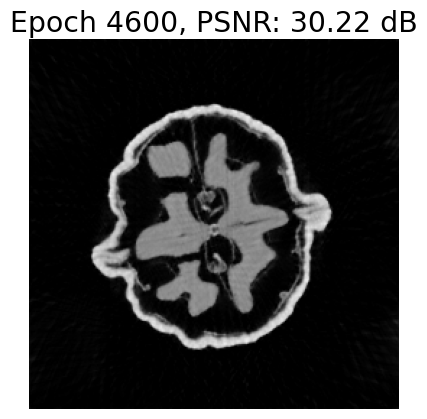

Epoch 4700, Loss: 0.0645
PSNR: 30.24 dB


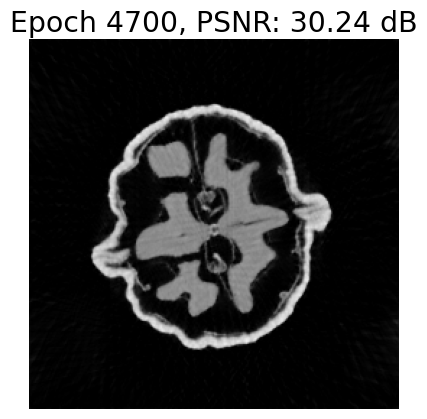

Epoch 4800, Loss: 0.0673
PSNR: 30.20 dB


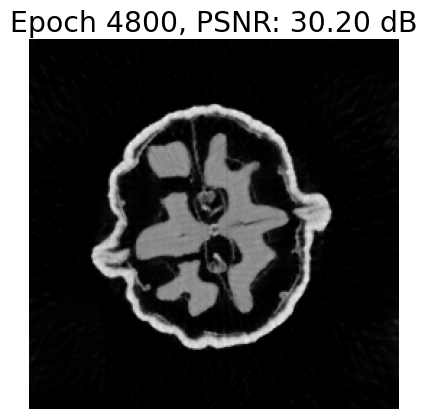

Epoch 4900, Loss: 0.0633
PSNR: 30.19 dB


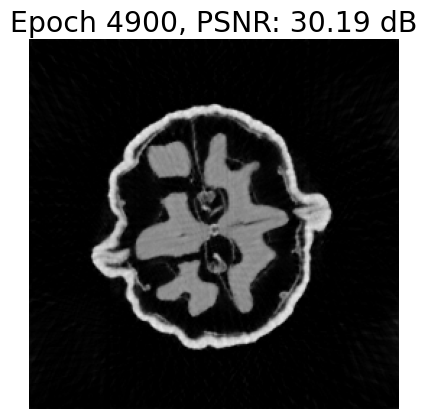

Epoch 5000, Loss: 0.0628
PSNR: 30.20 dB


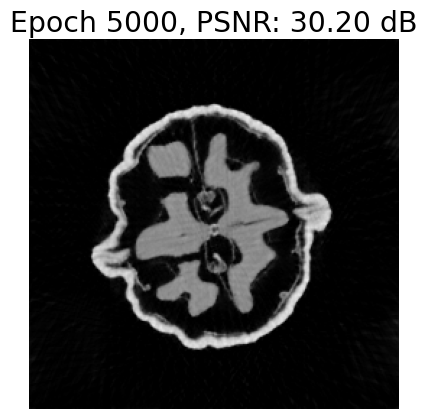

Epoch 5100, Loss: 0.0684
PSNR: 30.22 dB


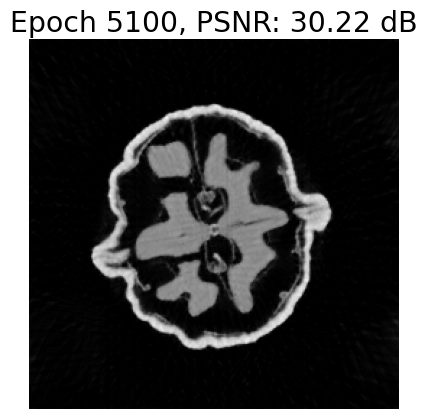

Epoch 5200, Loss: 0.0662
PSNR: 30.26 dB


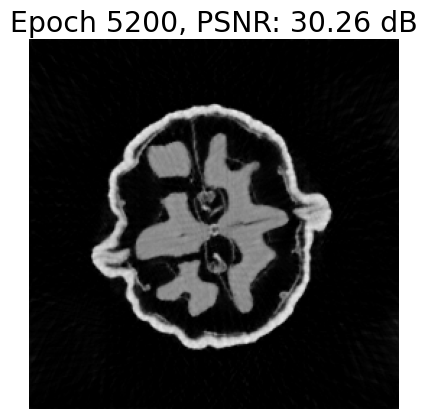

Epoch 5300, Loss: 0.0689
PSNR: 30.23 dB


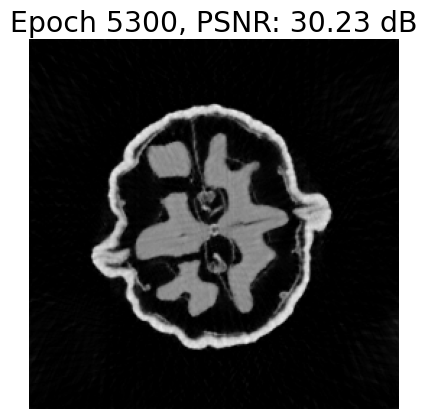

Epoch 5400, Loss: 0.0683
PSNR: 30.17 dB


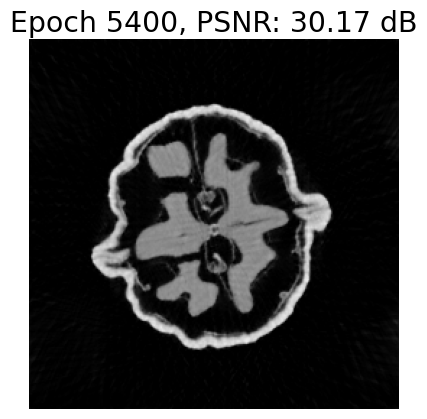

Epoch 5500, Loss: 0.0653
PSNR: 30.19 dB


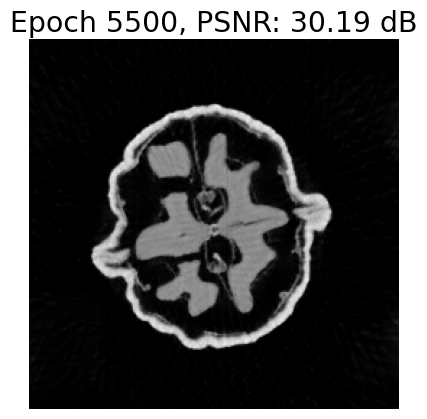

Epoch 5600, Loss: 0.0555
PSNR: 30.24 dB


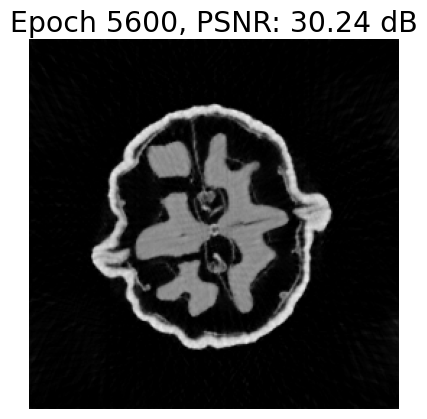

Epoch 5700, Loss: 0.0515
PSNR: 30.18 dB


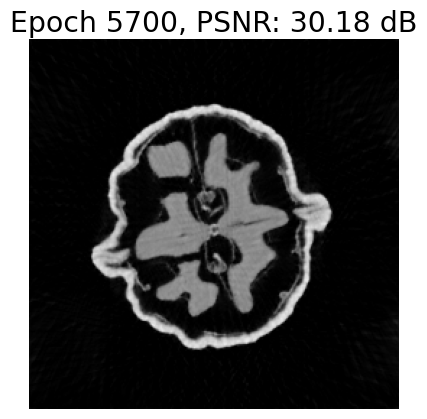

Epoch 5800, Loss: 0.0499
PSNR: 30.19 dB


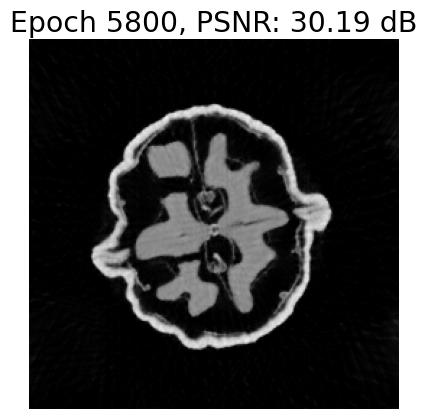

Epoch 5900, Loss: 0.1805
PSNR: 30.03 dB


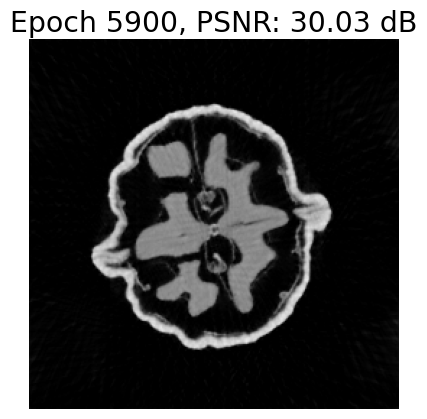

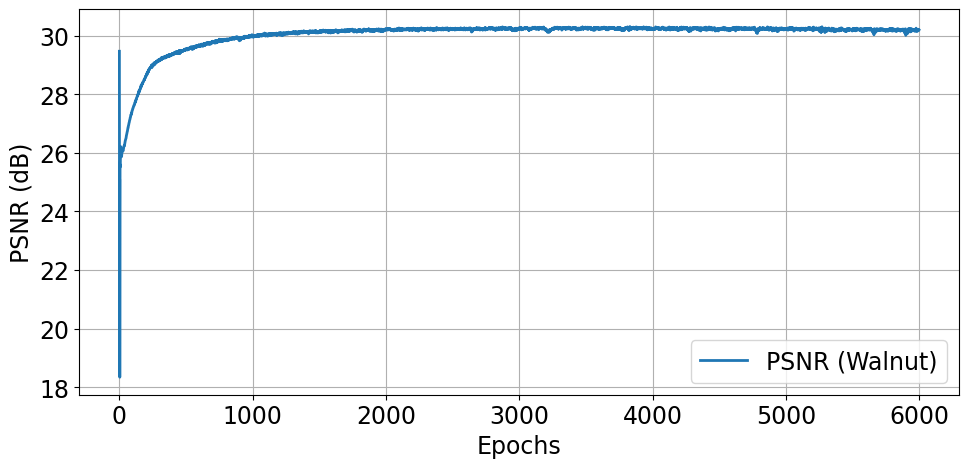

In [8]:
ellipse_model.train()
opt = torch.optim.Adam(ellipse_model.parameters(), lr=1e-4)
loss_fn = nn.MSELoss()

lambda_tv = 1e-3

y_noisy= physics_new(walnut_data)

z = torch.randn((1, 1, Height, Width), device=device)  # Initialize z with random noise

# Initialize lists to store PSNR values
psnr_ellipses = []
for epoch in range(epochs):
    opt.zero_grad()

    x_in = physics_new.A_dagger(y_noisy) # Add noise to the sinogram
    
    with torch.no_grad():
        if epoch == 0:
            plt.imshow(x_in.squeeze().cpu().detach().numpy(), cmap='gray', vmin=0, vmax=1)
            plt.title("Initial FBP")
            plt.axis('off')
            plt.show()
            plt.close()
            print(f"Initial PSNR: {dinv.metric.PSNR()(walnut_data, x_in).item():.2f} dB")
    
    
    x_pred = ellipse_model(x_in)  # Use the adjoint operator to initialize x_pred
    y_pred = physics_new.forward(x_pred) 
     
    grad_u = nabla(y_pred)
    Dx = grad_u[..., 0]
    Dy = grad_u[..., 1]
    mag = torch.sqrt((Dx**2 + Dy**2).sum(dim=1) + 1e-10) # avoid division by zero
    TV_val = mag.mean()
    lambda_tv = 0.01 # TV regularization weight
    
    loss = loss_fn(y_pred, y_noisy) + lambda_tv * TV_val

    loss.backward()
    opt.step()
    psnr_value = dinv.metric.PSNR()(walnut_data, x_pred).item()
    psnr_ellipses.append(psnr_value)
    if epoch % 100 == 0:
        print(f"Epoch {epoch}, Loss: {loss.item():.4f}")
        psnr = dinv.metric.PSNR()(walnut_data, x_pred).item()
        print(f"PSNR: {psnr:.2f} dB")
        plt.imshow(x_pred.squeeze().cpu().detach().numpy(), cmap='gray', vmin=0, vmax=1)
        plt.title(f"Epoch {epoch}, PSNR: {psnr:.2f} dB")
        plt.axis('off')
        plt.show()
        plt.close()
        
epochs_idx = list(range(len(psnr_ellipses)))
plt.figure(figsize=(10, 5))
plt.plot(epochs_idx, psnr_ellipses, label='PSNR (Walnut)')
plt.xlabel('Epochs')
plt.ylabel('PSNR (dB)')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()



### DIP with Disk Ellipses Pre Trained Weights

In [9]:
from Model_arch import UNet

angles_torch = torch.linspace(0, 180, 60, dtype = torch.float32, device=device) 
Height, Width = walnut_data.shape[-2], walnut_data.shape[-1]
physics_raw = dinv.physics.Tomography(
    img_width = Width, 
    angles=angles_torch, 
    device=device,
    noise_model=dinv.physics.GaussianNoise(sigma=0.8)
)
physics_new = OperatorModule(physics_raw)

disk_model = UNet(1,1)
disk_pretrained_weight= torch.load("checkpoints/pre_disk_model.pth", map_location=device)
disk_model.load_state_dict(disk_pretrained_weight)
disk_model.to(device)

UNet(
  (encoder1): Encoder(
    (conv1): ConvBlock(
      (conv): Conv2d(1, 32, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
      (act): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (conv2): ConvBlock(
      (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (act): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (downsample): ConvBlock(
      (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (act): LeakyReLU(negative_slope=0.2, inplace=True)
    )
  )
  (encoder2): Encoder(
    (conv1): ConvBlock(
      (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (act): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (conv2): ConvBlock(
      (conv): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (act): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (downsample): ConvBlock(
      (conv): Conv2d(64, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 

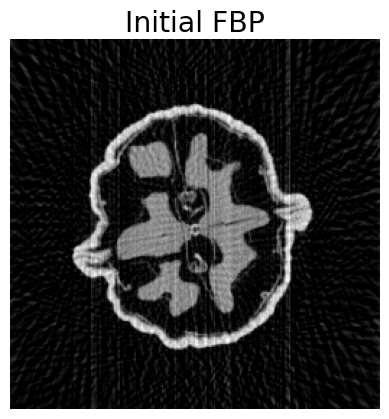

Initial PSNR: 22.78 dB
Epoch 0, Loss: 0.7893
PSNR: 29.46 dB


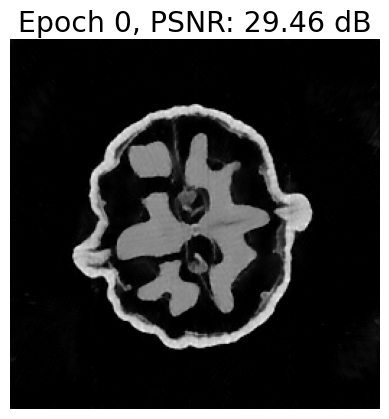

Epoch 100, Loss: 0.5195
PSNR: 27.51 dB


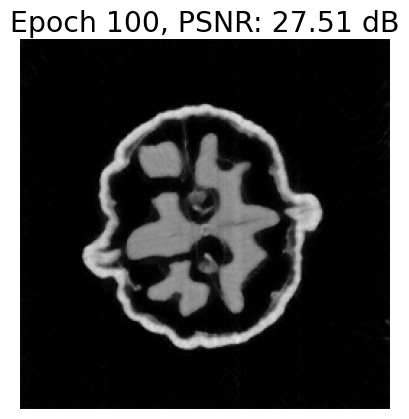

Epoch 200, Loss: 0.2835
PSNR: 28.64 dB


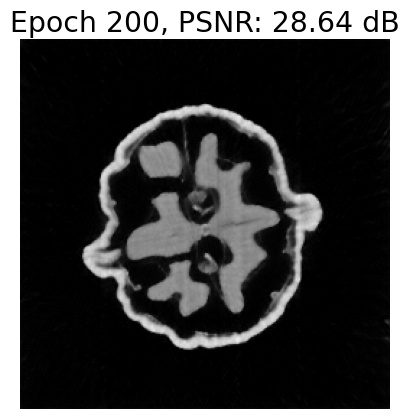

Epoch 300, Loss: 0.2010
PSNR: 29.19 dB


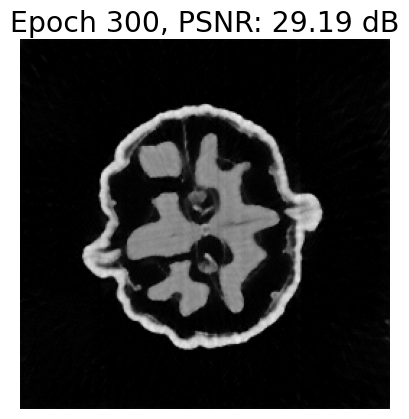

Epoch 400, Loss: 0.1733
PSNR: 29.39 dB


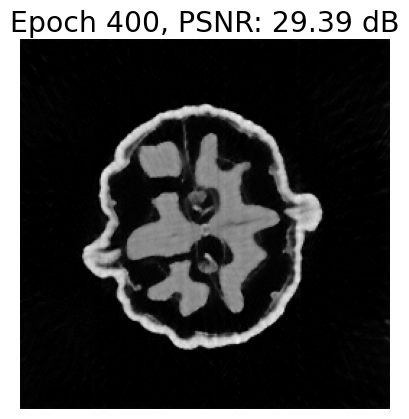

Epoch 500, Loss: 0.1779
PSNR: 29.50 dB


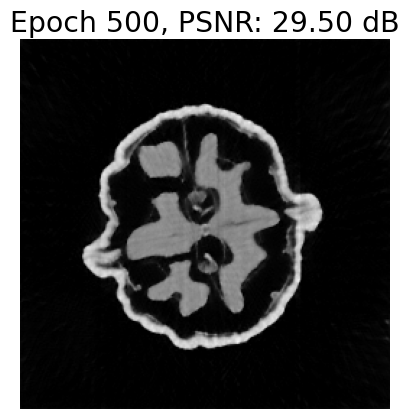

Epoch 600, Loss: 0.1473
PSNR: 29.66 dB


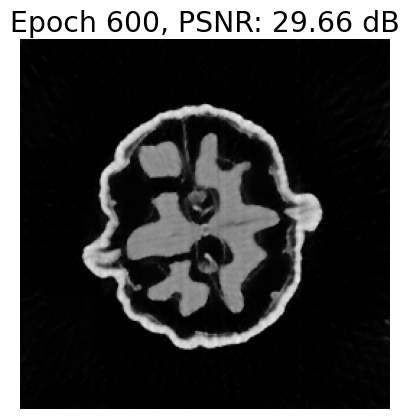

Epoch 700, Loss: 0.1707
PSNR: 29.78 dB


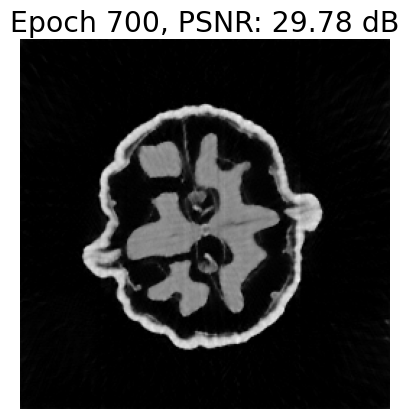

Epoch 800, Loss: 0.1290
PSNR: 29.83 dB


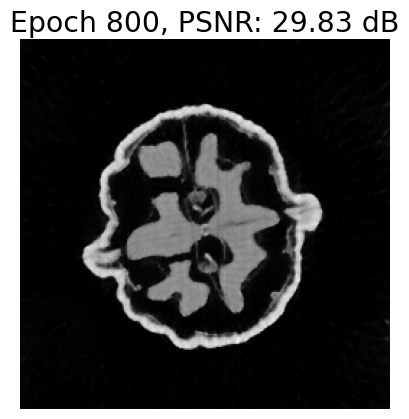

Epoch 900, Loss: 0.1265
PSNR: 29.91 dB


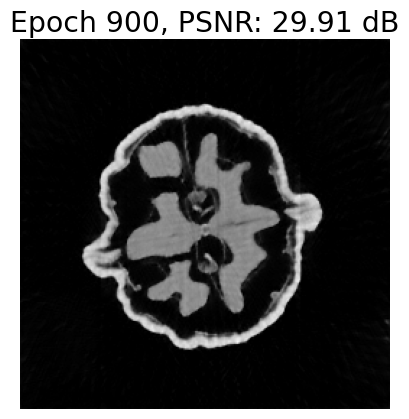

Epoch 1000, Loss: 0.1336
PSNR: 29.98 dB


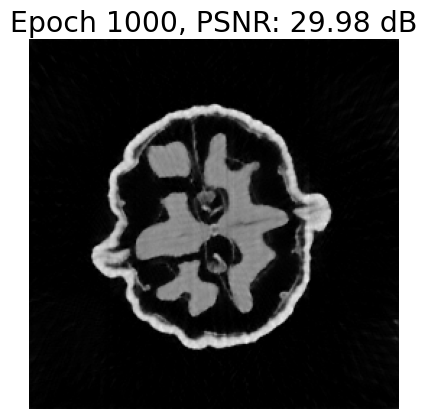

Epoch 1100, Loss: 0.1167
PSNR: 30.03 dB


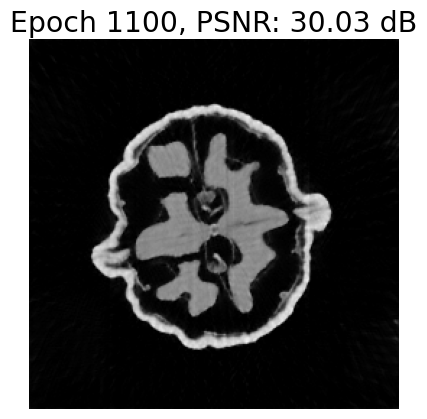

Epoch 1200, Loss: 0.1189
PSNR: 30.06 dB


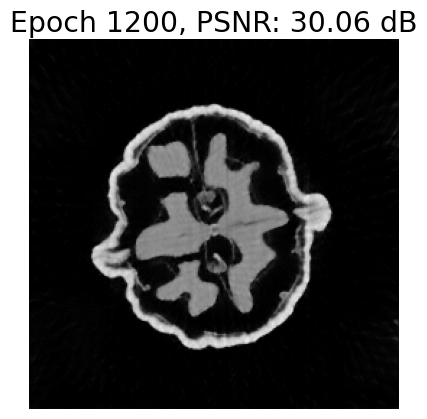

Epoch 1300, Loss: 0.1098
PSNR: 30.08 dB


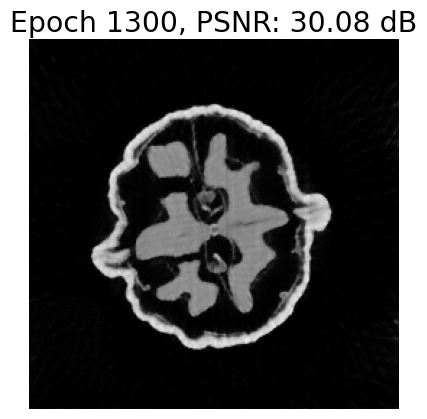

Epoch 1400, Loss: 0.1283
PSNR: 30.07 dB


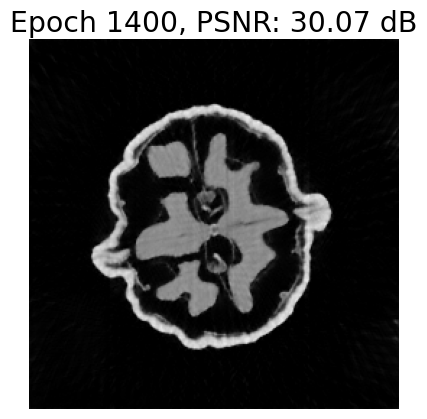

Epoch 1500, Loss: 0.1229
PSNR: 30.10 dB


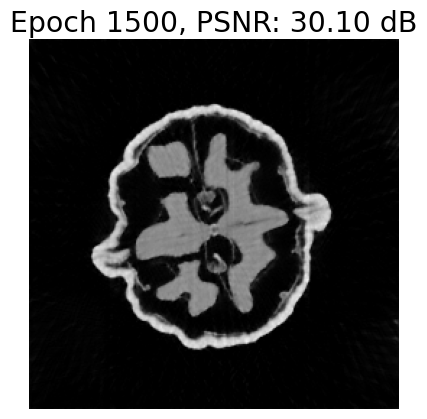

Epoch 1600, Loss: 0.0981
PSNR: 30.14 dB


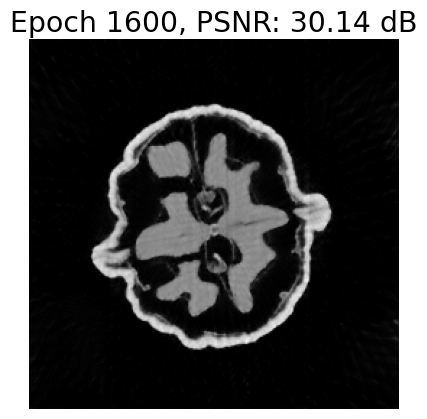

Epoch 1700, Loss: 0.1312
PSNR: 30.13 dB


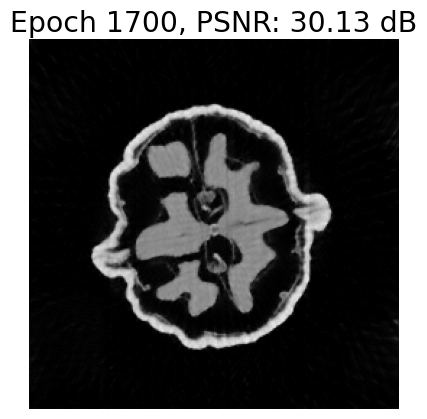

Epoch 1800, Loss: 0.1382
PSNR: 30.19 dB


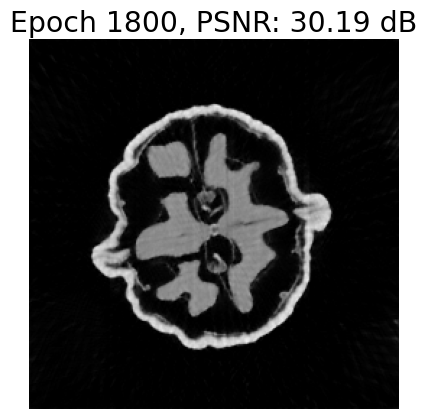

Epoch 1900, Loss: 0.1185
PSNR: 30.22 dB


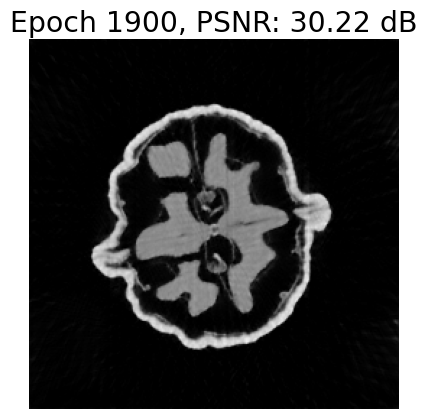

Epoch 2000, Loss: 0.1039
PSNR: 30.18 dB


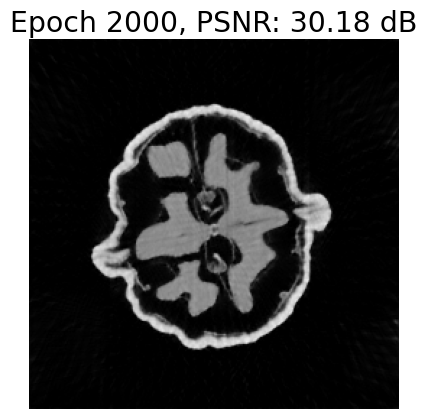

Epoch 2100, Loss: 0.1005
PSNR: 30.18 dB


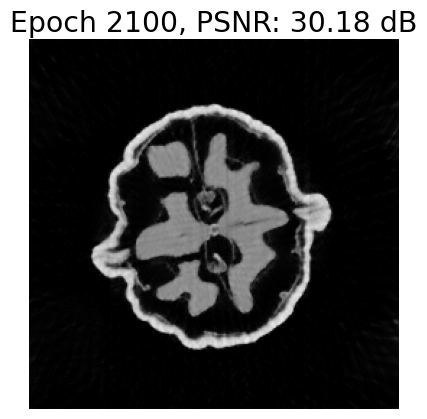

Epoch 2200, Loss: 0.0871
PSNR: 30.18 dB


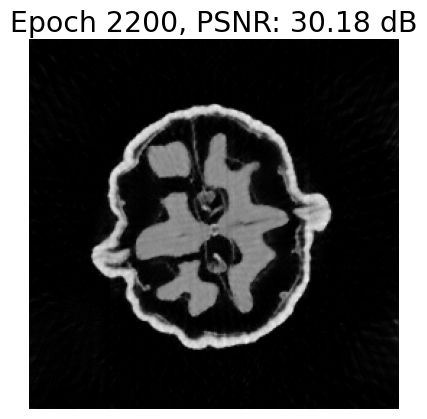

Epoch 2300, Loss: 0.1049
PSNR: 30.20 dB


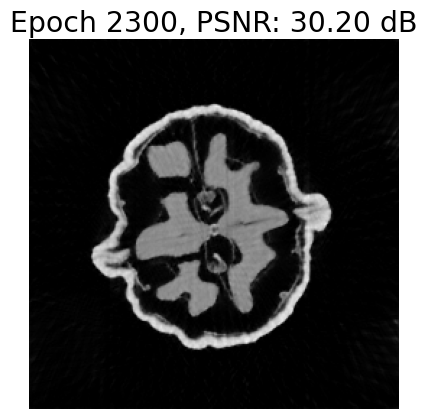

Epoch 2400, Loss: 0.0873
PSNR: 30.22 dB


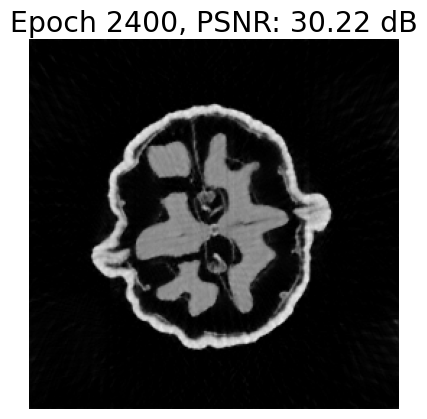

Epoch 2500, Loss: 0.0847
PSNR: 30.21 dB


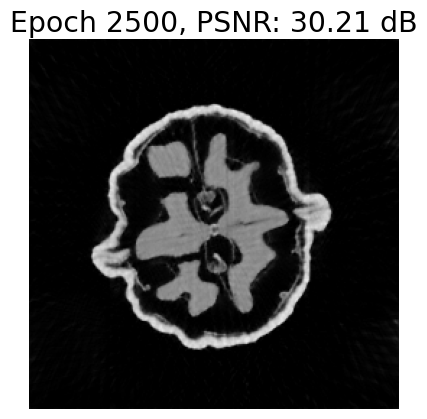

Epoch 2600, Loss: 0.0835
PSNR: 30.20 dB


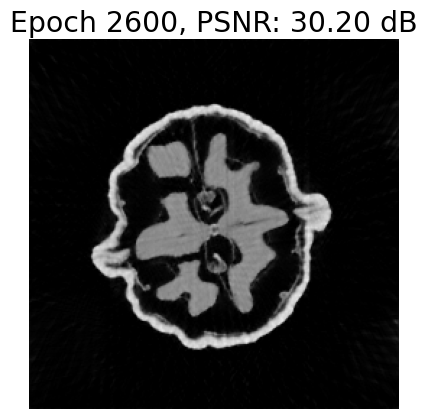

Epoch 2700, Loss: 0.0854
PSNR: 30.24 dB


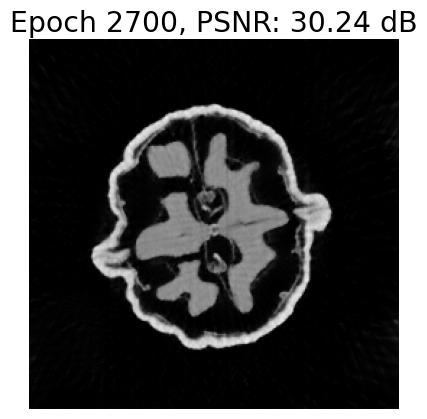

Epoch 2800, Loss: 0.0834
PSNR: 30.26 dB


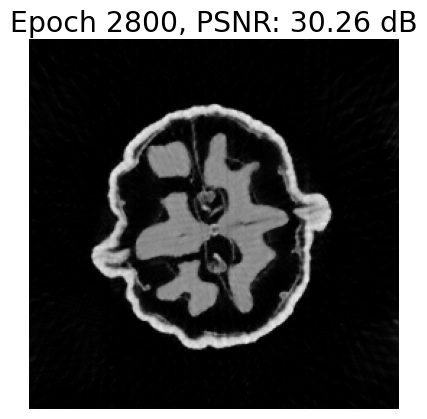

Epoch 2900, Loss: 0.0761
PSNR: 30.23 dB


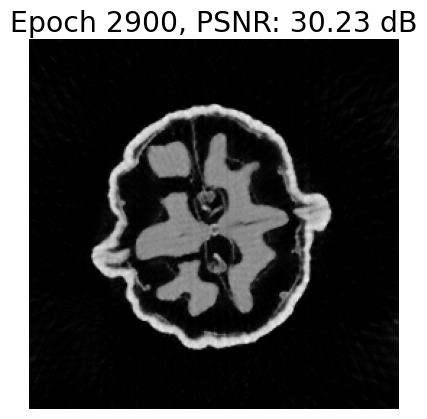

Epoch 3000, Loss: 0.0750
PSNR: 30.24 dB


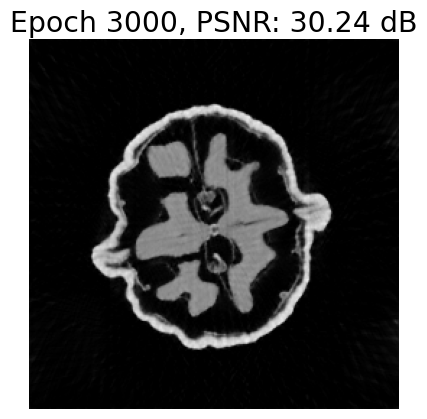

Epoch 3100, Loss: 0.0724
PSNR: 30.26 dB


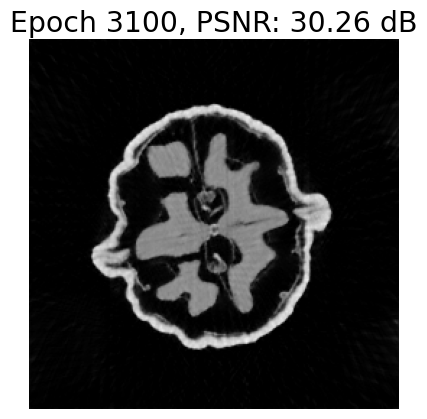

Epoch 3200, Loss: 0.1446
PSNR: 30.19 dB


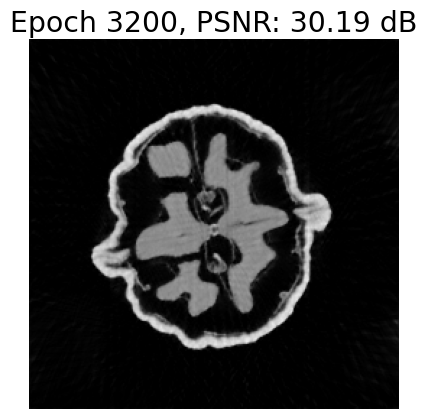

Epoch 3300, Loss: 0.0722
PSNR: 30.22 dB


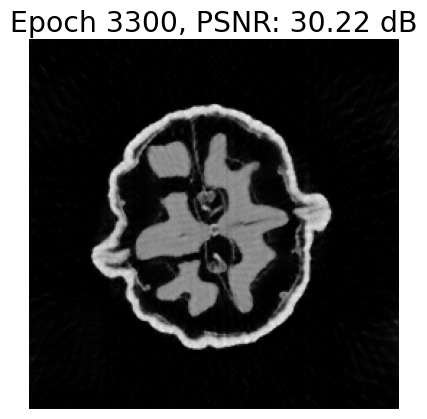

Epoch 3400, Loss: 0.0754
PSNR: 30.24 dB


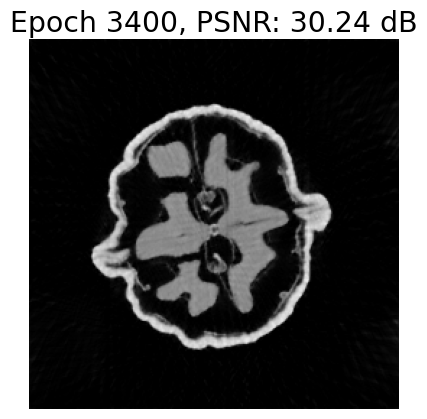

Epoch 3500, Loss: 0.0692
PSNR: 30.22 dB


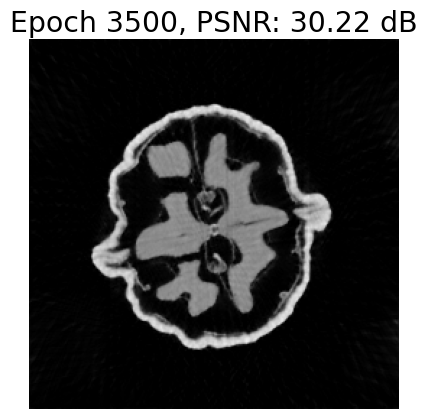

Epoch 3600, Loss: 0.0675
PSNR: 30.24 dB


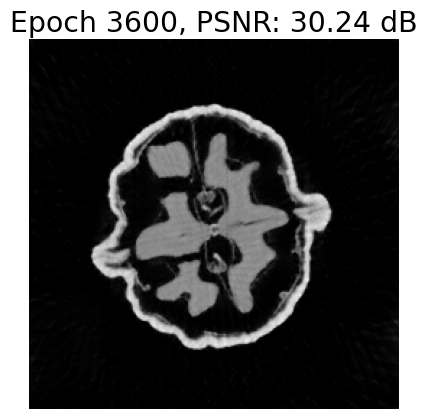

Epoch 3700, Loss: 0.0747
PSNR: 30.22 dB


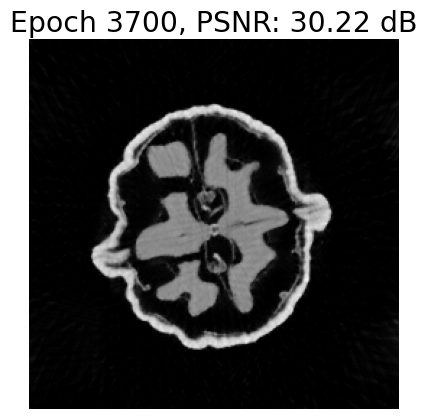

Epoch 3800, Loss: 0.0656
PSNR: 30.24 dB


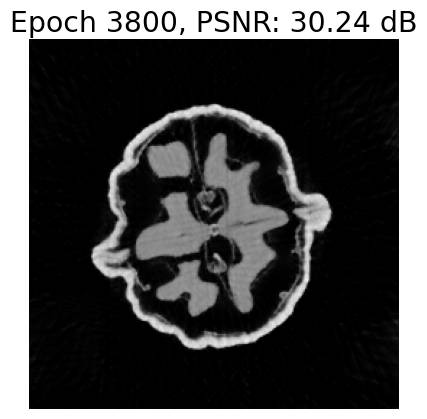

Epoch 3900, Loss: 0.0694
PSNR: 30.21 dB


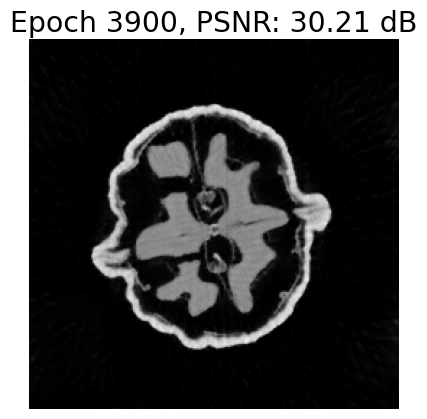

Epoch 4000, Loss: 0.0664
PSNR: 30.22 dB


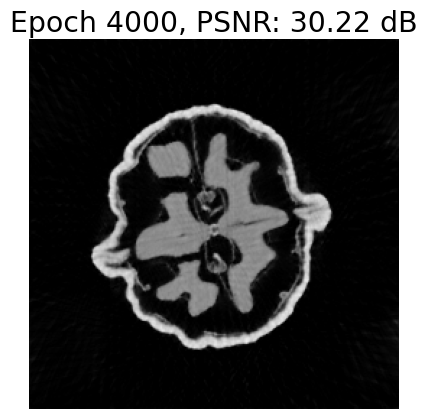

Epoch 4100, Loss: 0.0726
PSNR: 30.23 dB


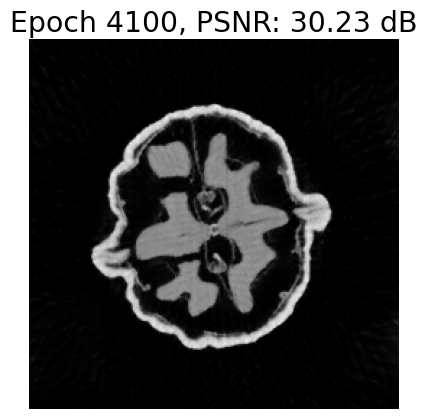

Epoch 4200, Loss: 0.1217
PSNR: 30.19 dB


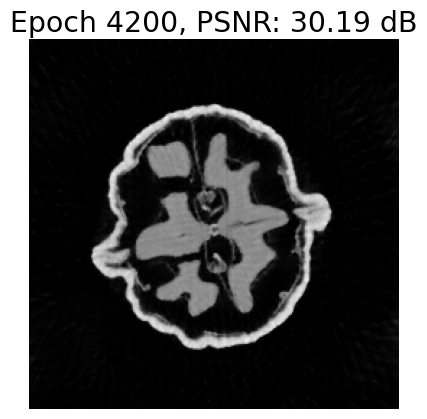

Epoch 4300, Loss: 0.0630
PSNR: 30.20 dB


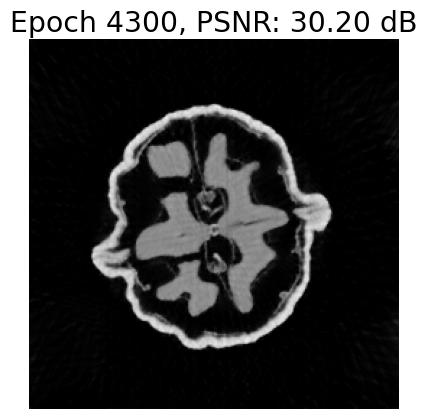

Epoch 4400, Loss: 0.0633
PSNR: 30.19 dB


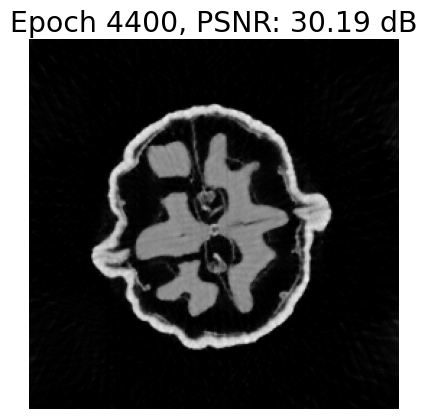

Epoch 4500, Loss: 0.0698
PSNR: 30.22 dB


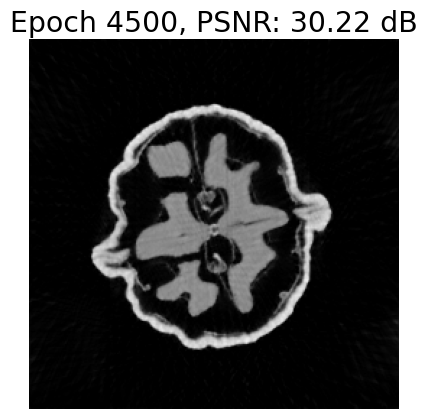

Epoch 4600, Loss: 0.0629
PSNR: 30.16 dB


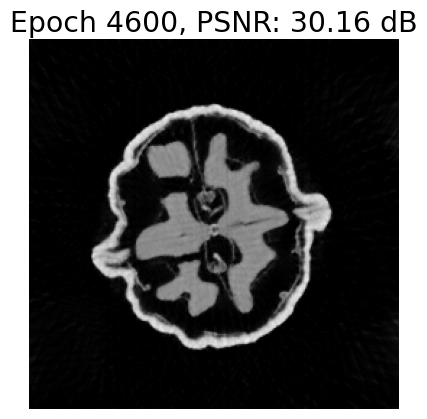

Epoch 4700, Loss: 0.0857
PSNR: 30.19 dB


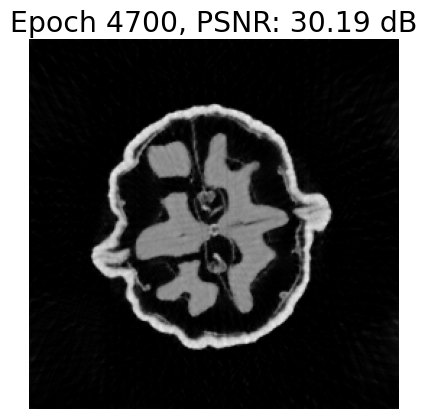

Epoch 4800, Loss: 0.0767
PSNR: 30.19 dB


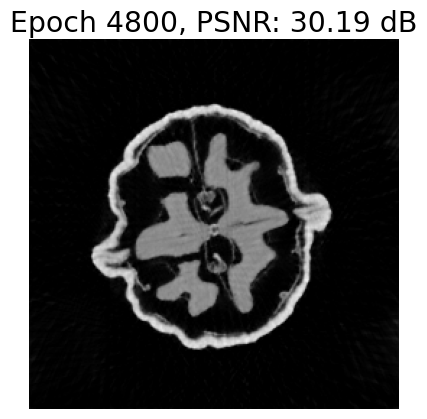

Epoch 4900, Loss: 0.0631
PSNR: 30.22 dB


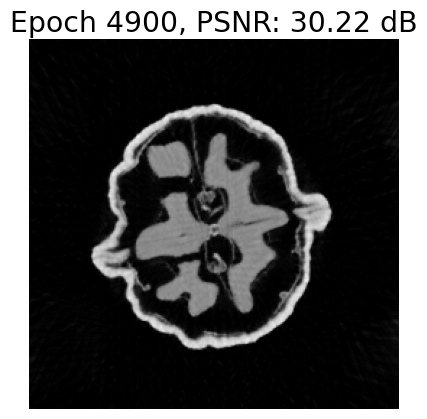

Epoch 5000, Loss: 0.0691
PSNR: 30.18 dB


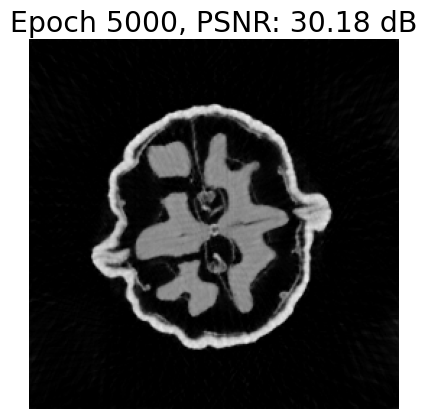

Epoch 5100, Loss: 0.0849
PSNR: 30.18 dB


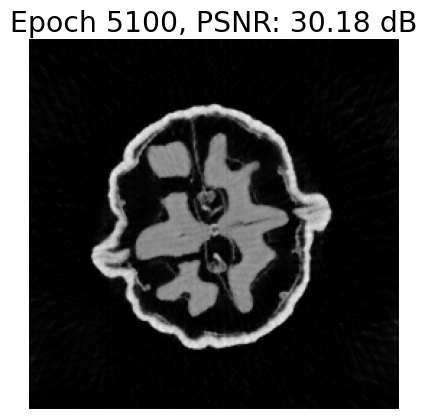

Epoch 5200, Loss: 0.0791
PSNR: 30.15 dB


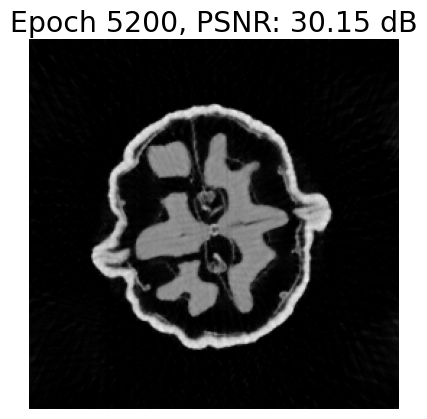

Epoch 5300, Loss: 0.0594
PSNR: 30.14 dB


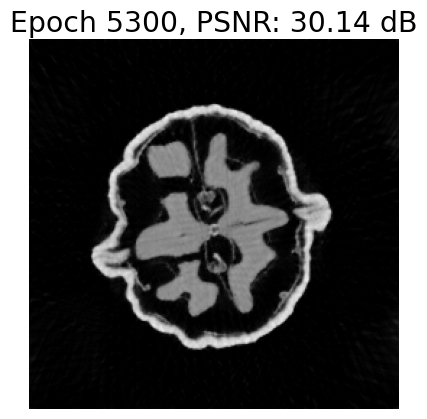

Epoch 5400, Loss: 0.0617
PSNR: 30.19 dB


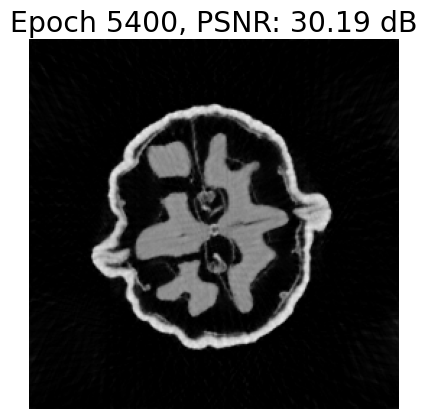

Epoch 5500, Loss: 0.0723
PSNR: 30.19 dB


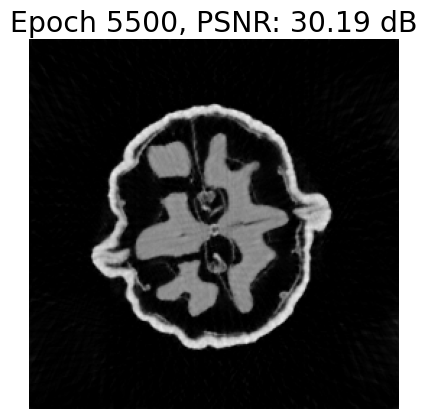

Epoch 5600, Loss: 0.0526
PSNR: 30.24 dB


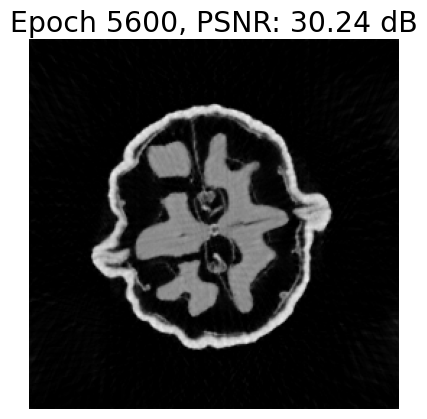

Epoch 5700, Loss: 0.0541
PSNR: 30.16 dB


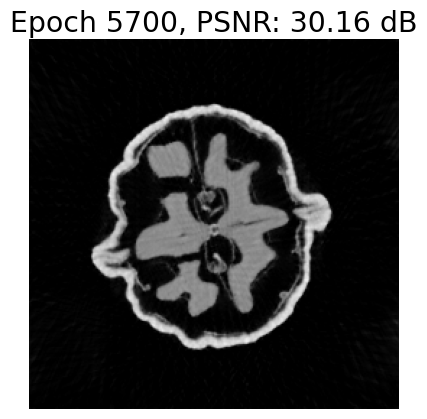

Epoch 5800, Loss: 0.0508
PSNR: 30.18 dB


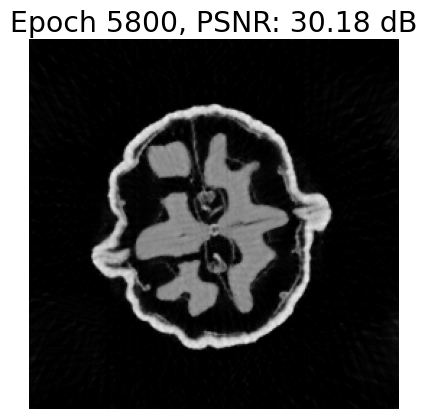

Epoch 5900, Loss: 0.0862
PSNR: 30.16 dB


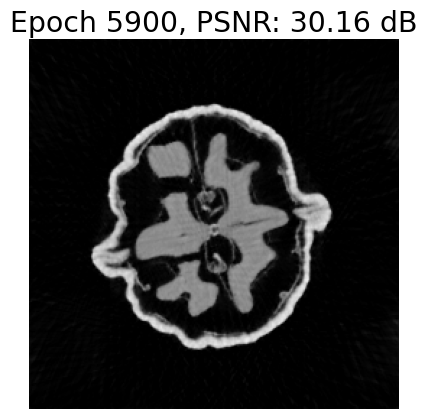

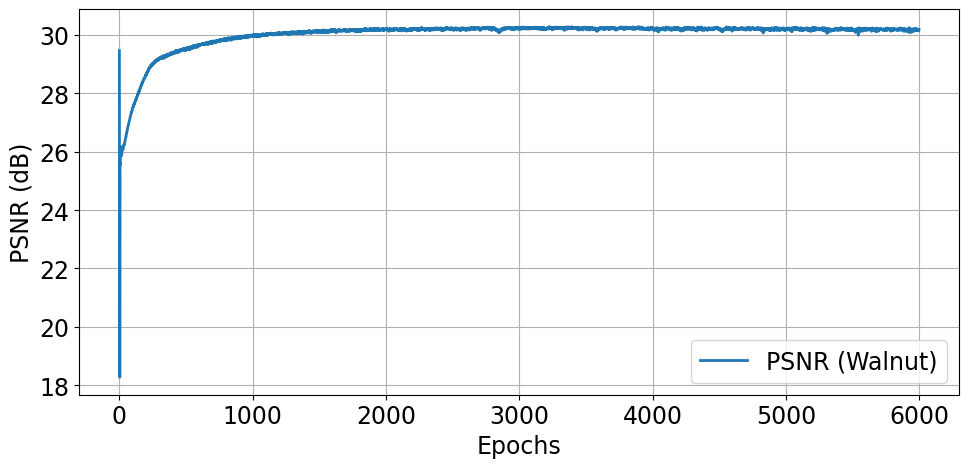

In [10]:
disk_model.train()
opt = torch.optim.Adam(disk_model.parameters(), lr=1e-4)
loss_fn = nn.MSELoss()
lambda_tv = 1e-3

z = torch.randn(1, 1, Height, Width, device=device) * 0.1  # random noise tensor [1,1,H,W]

y_noisy= physics_new(walnut_data)

# Initialize lists to store PSNR values
psnr_disk = []
for epoch in range(epochs):
    opt.zero_grad()

    x_in = physics_new.A_dagger(y_noisy)  # Add noise to the sinogram
    with torch.no_grad():
        if epoch == 0:
            plt.imshow(x_in.squeeze().cpu().detach().numpy(), cmap='gray', vmin=0, vmax=1)
            plt.title("Initial FBP")
            plt.axis('off')
            plt.show()
            plt.close()
            print(f"Initial PSNR: {dinv.metric.PSNR()(walnut_data, x_in).item():.2f} dB")
    
    x_pred = disk_model(x_in)
    y_pred = physics_new.forward(x_pred)

    grad_u = nabla(y_pred)
    Dx = grad_u[..., 0]
    Dy = grad_u[..., 1]
    mag = torch.sqrt((Dx**2 + Dy**2).sum(dim=1) + 1e-10) # avoid division by zero
    TV_val = mag.mean()
    lambda_tv = 0.01 # TV regularization weight
    loss = loss_fn(y_pred, y_noisy) + lambda_tv * TV_val

    loss.backward()
    opt.step()
    psnr_value = dinv.metric.PSNR()(walnut_data, x_pred).item()
    psnr_disk.append(psnr_value)
    if epoch % 100 == 0:
        print(f"Epoch {epoch}, Loss: {loss.item():.4f}")
        psnr = dinv.metric.PSNR()(walnut_data, x_pred).item()
        print(f"PSNR: {psnr:.2f} dB")
        plt.imshow(x_pred.squeeze().cpu().detach().numpy(), cmap='gray', vmin=0, vmax=1)
        plt.title(f"Epoch {epoch}, PSNR: {psnr:.2f} dB")
        plt.axis('off')
        plt.show()
        plt.close()
        
epochs_idx = list(range(len(psnr_disk)))
plt.figure(figsize=(10, 5))
plt.plot(epochs_idx, psnr_disk, label='PSNR (Walnut)')
plt.xlabel('Epochs')
plt.ylabel('PSNR (dB)')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()



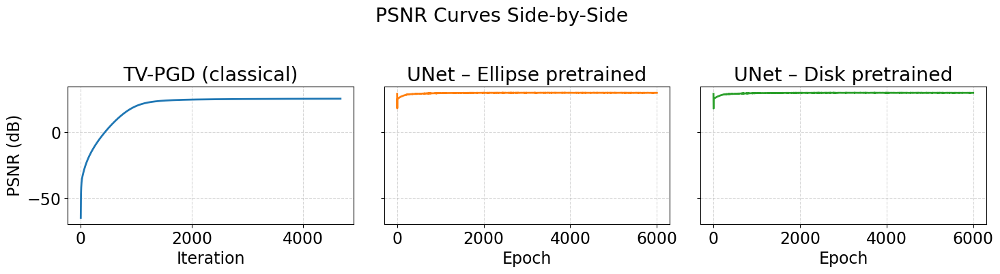

In [11]:
epochs_classic  = list(range(len(psnr_classic)))
epochs_ellipse  = list(range(len(psnr_ellipses)))
epochs_disk     = list(range(len(psnr_disk)))

# 2) Make 1×3 subplots, sharing the y-axis for easy comparison
fig, axes = plt.subplots(1, 3, figsize=(15, 4), sharey=True)

# TV-PGD (classical)
axes[0].plot(epochs_classic, psnr_classic, color="C0")
axes[0].set_title("TV-PGD (classical)")
axes[0].set_xlabel("Iteration")
axes[0].set_ylabel("PSNR (dB)")
axes[0].grid(linestyle="--", alpha=0.5)

# UNet-ellipse
axes[1].plot(epochs_ellipse, psnr_ellipses, color="C1")
axes[1].set_title("UNet – Ellipse pretrained")
axes[1].set_xlabel("Epoch")
axes[1].grid(linestyle="--", alpha=0.5)

# UNet-disk
axes[2].plot(epochs_disk, psnr_disk, color="C2")
axes[2].set_title("UNet – Disk pretrained")
axes[2].set_xlabel("Epoch")
axes[2].grid(linestyle="--", alpha=0.5)

plt.suptitle("PSNR Curves Side-by-Side", y=1.02)
plt.tight_layout()
plt.show()